In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [30]:
import hamiltonian_monte_carlo as hmc
import diagnostics
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import patches
from matplotlib import path as mpath
import pickle

SyntaxError: invalid syntax (<ipython-input-30-57e31ddb2753>, line 3)

## Toy Problem

$ P(\theta) \sim \frac{3}{4} \mathcal{N} (1, 0.1) + \frac{1}{4} \mathcal{N} (6, 1) $

In [54]:
def toy_problem_log_density(theta):
    return np.log(0.75 * hmc.norm.pdf(theta, loc=1, scale=0.1) + \
                  0.25 * hmc.norm.pdf(theta, loc=6, scale=1))


In [55]:
hmc.hamiltonian_monte_carlo(toy_problem_log_density, 0.0, 0.01, 20, 20)

array([[ 0.25280879,  1.84933028,  1.        ],
       [ 0.37717242,  1.63179914,  1.        ],
       [ 1.22210239,  5.69062306,  1.        ],
       [ 0.86004561, -1.79932617,  1.        ],
       [ 1.31340294,  0.10223421,  1.        ],
       [ 0.83729631, -2.69830242,  1.        ],
       [ 1.08622329,  1.39279619,  1.        ],
       [ 0.96814429, -0.80148772,  1.        ],
       [ 0.97492002,  0.46491857,  1.        ],
       [ 0.96415272,  0.43979144,  1.        ],
       [ 1.11934286, -0.15281294,  1.        ],
       [ 0.88318289, -0.7762014 ,  1.        ],
       [ 1.06197987,  0.99965455,  1.        ],
       [ 0.92952774, -0.35820267,  1.        ],
       [ 1.00263697,  0.76226554,  1.        ],
       [ 0.71503728,  1.27641335,  1.        ],
       [ 1.10720625,  2.64004961,  1.        ],
       [ 1.04907434, -1.4027812 ,  1.        ],
       [ 0.84737084,  0.15995759,  1.        ],
       [ 1.01225712,  1.62093174,  1.        ]])

In [61]:
samples = hmc.hamiltonian_monte_carlo(toy_problem_log_density, 0.0, 0.05, 20, 20)


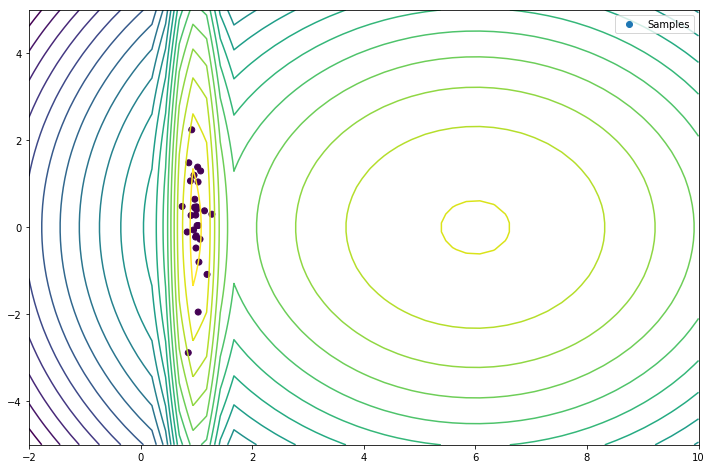

In [67]:
h = generate_hamiltonian(toy_problem_log_density)
theta_values = np.linspace(-2, 10, 50)
r_values = np.linspace(-5, 5, 50)
theta_grid, r_grid = np.meshgrid(theta_values, r_values)
z = h(theta_grid, r_grid)
samples = hmc.hamiltonian_monte_carlo(toy_problem_log_density, 1.0, 0.05, 30, 30)

plt.figure(figsize=(12, 8))
plt.contour(theta_grid, r_grid, z, 20)
plt.scatter(samples[:,0], samples[:,1], c=samples[:,2], label='Samples')
plt.legend(loc='best')



In [70]:
v = samples[:,0]
np.correlate(v, v, mode='same')

array([14.72983308, 15.6991178 , 16.73221119, 17.61598463, 18.58151943,
       19.59179857, 20.54518916, 21.5172605 , 22.62076087, 23.44698356,
       24.68156016, 25.49015388, 26.50206575, 27.72371168, 28.39269204,
       29.77064496, 28.39269204, 27.72371168, 26.50206575, 25.49015388,
       24.68156016, 23.44698356, 22.62076087, 21.5172605 , 20.54518916,
       19.59179857, 18.58151943, 17.61598463, 16.73221119, 15.6991178 ])

## Ideas for assignment
* Investigate performance over different values of epsilon, L, momentum variance
    * Keep $ T = L\epsilon $ constant an see how choices on that line change behavior
* Compare Langevin HMC to regualr HMC
* Compare on a few different problems
* Compare to NUTS
* Compare to more efficient NUTS?
* Compare HMC and Gibbs/Slice on a few toy problems?
* Trying implementing the warm-up with default Euclidean metric - estimate covariance - update metric scheme, see if that ends up improving performance, and if so, try to quantify it
* Implement metric evaluations - ESS (integrated autocorrelation), E-BMFI, $\hat{R}$? 

In [29]:
def generate_hamiltonian(log_density):
    def h(theta, r):
        return log_density(theta) - 0.5 * np.dot(r, r)
    
    return h

h = generate_hamiltonian(toy_problem_log_density)

array([-862.14196759, -860.93829208, -858.05686688, -848.25844065,
       -842.42756711, -840.76159472, -843.26054901, -849.91508253,
       -853.67798112, -852.80835659, -851.97953527, -851.19236326,
       -850.44684056, -849.74296717, -849.0807431 , -848.46016834,
       -847.88124289, -847.34396676, -846.84833993, -846.39436242,
       -845.98203423, -845.61135534, -845.28232577, -844.99494551,
       -844.74921457, -844.54513294, -844.38270062, -844.26191761,
       -844.18278391, -844.14529953, -844.14946446, -844.19527871,
       -844.28274227, -844.41185514, -844.58261732, -844.79502881,
       -845.04908962, -845.34479974, -845.68215918, -846.06116792,
       -846.48182598, -846.94413335, -847.44809004, -847.99369603,
       -848.58095134, -849.20985597, -849.8804099 , -850.59261315,
       -851.34646571, -852.14196759])

In [4]:
def toy_problem_density(theta):
    return 0.75 * norm.pdf(theta, loc=1, scale=0.1) + \
            0.25 * norm.pdf(theta, loc=6, scale=1)

def toy_problem_log_density(theta):
    return np.log(toy_problem_density(theta))

def toy_problem_log_density_gradient(theta):
    return 1.0 / ( np.sqrt(2 * np.pi) * toy_problem_density(theta) ) * \
        (750 * (1 - theta) * np.exp(-50 * (theta - 1) ** 2) + 0.25 * (6 - theta) * np.exp(-0.5 * (theta - 6)**2))

In [118]:
samples = np.random.normal(0, 1, (4, 20, 2))
m, n, k = samples.shape
split_chain_samples = np.vstack((samples[:, :n // 2, :], samples[:, n // 2:, :]))
m_eff = 2 * m
n_eff = n // 2

per_chain_mean = np.mean(split_chain_samples, axis=1)
overall_mean = np.mean(per_chain_mean, axis=0)

between_chain_variance = n_eff * (m_eff - 1) * np.sum(np.square(per_chain_mean - overall_mean), axis=0)
print(between_chain_variance.shape)

per_chain_variance = 1 / (n_eff - 1) * np.sum(np.square(split_chain_samples - np.expand_dims(per_chain_mean, 1)), axis=1)
within_chain_variance = np.mean(per_chain_variance, axis=0)

marginal_posterior_variance = ((n_eff - 1) * within_chain_variance + between_chain_variance) / n_eff

marginal_posterior_variance.shape, within_chain_variance.shape

(2,)


((2,), (2,))

In [109]:
split_chain_samples[:,3:,:].shape

(8, 7, 2)

In [110]:
np.mean(split_chain_samples[:,3:,:] - split_chain_samples[:,:-3,:], axis=(0, 1))

array([0.03608998, 0.02449813])

In [94]:
np.expand_dims(per_chain_mean, 1).shape

(8, 1, 2)

In [100]:
per_chain_variance = 1 / (n_eff - 1) * np.sum(np.square(split_chain_samples - np.expand_dims(per_chain_mean, 1)), axis=1)
np.mean(per_chain_variance, axis=0).shape

(2,)

In [105]:
np.sqrt(np.array([2, 3]) / np.array([4, 5]))

array([0.70710678, 0.77459667])

In [111]:
len({1:2})

1

In [112]:
import diagnostics

In [122]:
diagnostics.effective_sample_size(samples)

array([15.99938904, 15.98310392])

## 2-D Mixture of Gaussians, and plotting

In [37]:
def two_d_mixture_gaussians(theta):
    return hmc.np.log(0.5 * hmc.stats.multivariate_normal.pdf(theta, mean=hmc.np.array([2, 12]),
                                                          cov=hmc.np.array(([[2, 0.5], [0.5, 1]]))) + \
                  0.25 * hmc.stats.multivariate_normal.pdf(theta, mean=hmc.np.array([10, -8]),
                                                           cov=hmc.np.array(([[1, 0.9], [0.9, 2]]))) + \
                  0.25 * hmc.stats.multivariate_normal.pdf(theta, mean=hmc.np.array([-12, -9]),
                                                           cov=hmc.np.array(([[0.5, 0], [0, 0.5]]))))

In [108]:
DEFAULT_COLORMAP = 'Paired'


def sample_and_plot(sample_generating_function, num_chains, log_density,
                    first_param_limits, second_param_limits, suptitle='', 
                    temperature=1.0, warmup_proportion=0.5, colormap_name=DEFAULT_COLORMAP):
    all_samples = []
    all_theta_samples = []
    
    for i in range(num_chains):
        samples = sample_generating_function()
        all_samples.append(np.copy(samples))
        theta_samples = np.stack(np.ndarray.flatten(samples[:, 0]))
        all_theta_samples.append(np.copy(theta_samples))
        
    two_d_countour_plot(log_density, num_chains, first_param_limits, second_param_limits,
                        all_samples, all_theta_samples, suptitle, 
                        warmup_proportion, temperature, colormap_name)
    
    return all_samples, all_theta_samples


def two_d_countour_plot(log_density, num_chains, first_param_limits, second_param_limits,
                        all_samples, all_theta_samples, suptitle='', warmup_propotion=0.5,
                        temperature=1.0, colormap_name=DEFAULT_COLORMAP):
    theta_one_values = np.linspace(first_param_limits[0], first_param_limits[1], 100)
    theta_two_values = np.linspace(second_param_limits[0], second_param_limits[1], 100)
    
    theta_one_grid, theta_two_grid = np.meshgrid(theta_one_values, theta_two_values)
    theta_grid = np.stack((theta_one_grid, theta_two_grid), axis=2)
    contour_values = log_density(theta_grid) / temperature
    
    plt.figure(figsize=(12, 12))
    plt.contour(theta_one_grid, theta_two_grid, contour_values, 30)
    
    if num_chains > 0:    
        real_sample_start = int(all_theta_samples[0].shape[0] * warmup_propotion)
        colormap = plt.get_cmap(colormap_name)
        
        for i in range(num_chains):
            sample_colors = all_samples[i][:,2].astype(np.int32) + (2 * i)
            sample_colors = [colormap.colors[x] for x in sample_colors]
            plt.scatter(all_theta_samples[i][real_sample_start:,0], 
                        all_theta_samples[i][real_sample_start:,1], 
                        c=sample_colors[real_sample_start:], label=f'Chain #{i+1}')

        legend = plt.legend(loc='best')
        for i in range(num_chains):
            legend.legendHandles[i].set_color(colormap.colors[(2 * i) + 1])

        theta_samples = np.asarray(all_theta_samples)[:, real_sample_start:, :]
        ess = diagnostics.effective_sample_size(theta_samples)
        rhat = diagnostics.split_r_hat(theta_samples)

        with np.printoptions(precision=5, suppress=True):
            plt.title(f'Sampling results, {all_theta_samples[0].shape[0] - real_sample_start} post-warm-up samples, ESS = {ess}, $\\hat{{R}}$ = {rhat}')
    
    plt.suptitle(suptitle, size=20, y=0.93)
    
    plt.show()

In [33]:
with open('results.pickle', 'rb') as f:
        results = pickle.load(f)

In [ ]:
theta_0_sampler = lambda: np.random.uniform(-10, 10, 2)
# results = {}

for leapfrog in np.arange(start=400, stop=2200, step=400):
    # for epsilon in np.arange(start=0.8, stop=2.2, step=0.2):
    for epsilon in np.arange(start=1.0, stop=2.2, step=0.2):
        def sample():
            return hmc.hamiltonian_monte_carlo(two_d_mixture_gaussians, theta_0_sampler(), 
                                               epsilon, leapfrog, 4000, 2, log_interval=400)

        all_samples, all_theta_samples = \
            sample_and_plot(sample, 2, two_d_mixture_gaussians, [-20, 20], [-20, 20], 
                           f'$\\epsilon = {epsilon}$, {leapfrog} leapfrog iterations')
        
        results[(epsilon, leapfrog)] = (all_samples, all_theta_samples)
        with open('results.pickle', 'wb') as f:
            pickle.dump(results, f)

In [47]:
all_theta_samples[0].shape[0]

4000

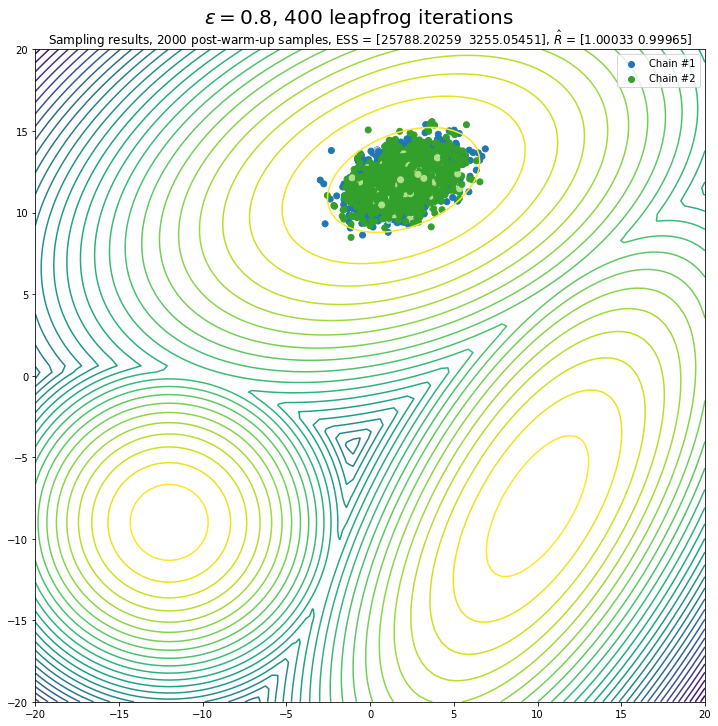

In [60]:
all_samples, all_theta_samples = results[(0.8, 400)]
two_d_countour_plot(two_d_mixture_gaussians, 2, [-20, 20], [-20, 20], all_samples, all_theta_samples,
                   r'$\epsilon = 0.8$, 400 leapfrog iterations')

## Let's try doubling epsilon, see if that encourages exploration better

Sampling 4000 iterations with 400 leapfrog iterations with epsilon = 1.6
Sampled 100 iterations of which 65 were accepted
Sampled 200 iterations of which 130 were accepted
Sampled 300 iterations of which 193 were accepted
Sampled 400 iterations of which 252 were accepted
Sampled 500 iterations of which 315 were accepted
Sampled 600 iterations of which 377 were accepted
Sampled 700 iterations of which 438 were accepted
Sampled 800 iterations of which 499 were accepted
Sampled 900 iterations of which 570 were accepted
Sampled 1000 iterations of which 630 were accepted
Sampled 1100 iterations of which 696 were accepted
Sampled 1200 iterations of which 768 were accepted
Sampled 1300 iterations of which 837 were accepted
Sampled 1400 iterations of which 899 were accepted
Sampled 1500 iterations of which 958 were accepted
Sampled 1600 iterations of which 1026 were accepted
Sampled 1700 iterations of which 1094 were accepted
Sampled 1800 iterations of which 1156 were accepted
Sampled 1900 ite

/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: divide by zero encountered in log
  return f_raw(*args, **kwargs)
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:76: RuntimeWarning: divide by zero encountered in true_divide
  defvjp(anp.log,    lambda ans, x : lambda g: g / x)
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/scipy/stats/multivariate_normal.py:50: RuntimeWarning: invalid value encountered in double_scalars
  unbroadcast_f(x, lambda g: -np.expand_dims(ans * g, 1) * solve(allow_singular)(cov, (x - mean).T).T),


Sampled 100 iterations of which 66 were accepted
Sampled 200 iterations of which 129 were accepted
Sampled 300 iterations of which 189 were accepted
Sampled 400 iterations of which 253 were accepted
Sampled 500 iterations of which 322 were accepted
Sampled 600 iterations of which 380 were accepted
Sampled 700 iterations of which 435 were accepted
Sampled 800 iterations of which 502 were accepted
Sampled 900 iterations of which 562 were accepted
Sampled 1000 iterations of which 621 were accepted
Sampled 1100 iterations of which 679 were accepted
Sampled 1200 iterations of which 744 were accepted
Sampled 1300 iterations of which 801 were accepted
Sampled 1400 iterations of which 860 were accepted
Sampled 1500 iterations of which 922 were accepted
Sampled 1600 iterations of which 983 were accepted
Sampled 1700 iterations of which 1041 were accepted
Sampled 1800 iterations of which 1109 were accepted
Sampled 1900 iterations of which 1180 were accepted
Sampled 2000 iterations of which 1240 

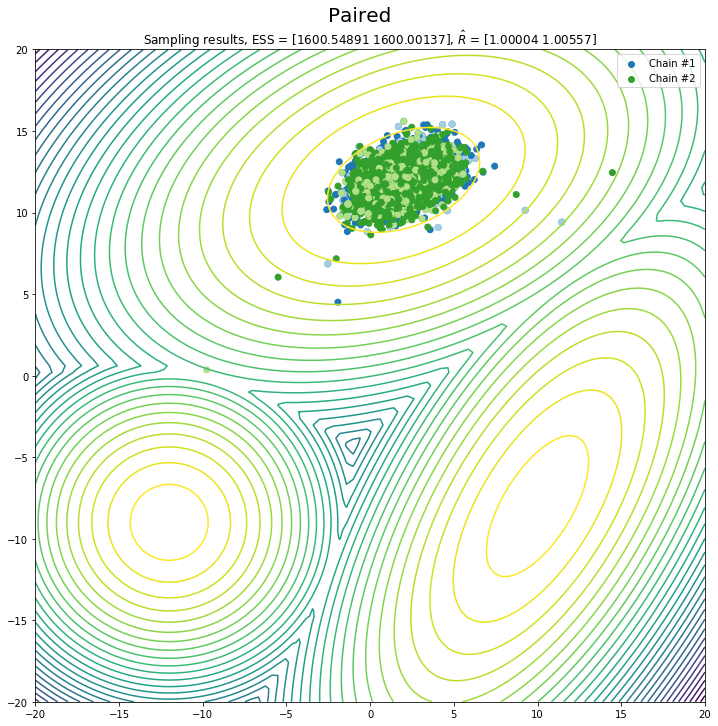

In [39]:
theta_0_sampler = lambda: np.random.uniform(-10, 10, 2)
# results = {}

epsilon = 1.6
leapfrog = 400

def sample():
    return hmc.hamiltonian_monte_carlo(two_d_mixture_gaussians, theta_0_sampler(), 
                                       epsilon, leapfrog, 4000, 2, log_interval=100)

all_samples, all_theta_samples = \
    sample_and_plot(sample, 2, two_d_mixture_gaussians, [-20, 20], [-20, 20], 
                   f'$\\epsilon = {epsilon}$, {leapfrog} leapfrog iterations')

results[epsilon, leapfrog] = all_samples, all_theta_samples
with open('results.pickle', 'wb') as f:
    pickle.dump(results, f)

## Results:
Explored ever-so-slightly better, rejected way more samples, but still did not come close to arriving at a new mode. ESS and R-hat would both again appear to indicate no problems.

Let's try playing around with the momentum standard deviation, and see if that encourages more variation. Sampling with double the momentum and $ \epsilon = 1.6 $ resulted in an abysmally acceptance rate (< 30%), so I reduced it.

HMC: sampling 2000 iterations with 400 leapfrog iterations with epsilon = 1.0
Sampled 100 iterations of which 74 were accepted
Sampled 200 iterations of which 152 were accepted
Sampled 300 iterations of which 224 were accepted
Sampled 400 iterations of which 301 were accepted
Sampled 500 iterations of which 380 were accepted
Sampled 600 iterations of which 458 were accepted
Sampled 700 iterations of which 543 were accepted
Sampled 800 iterations of which 624 were accepted
Sampled 900 iterations of which 705 were accepted
Sampled 1000 iterations of which 780 were accepted
Sampled 1100 iterations of which 856 were accepted
Sampled 1200 iterations of which 930 were accepted
Sampled 1300 iterations of which 1011 were accepted
Sampled 1400 iterations of which 1092 were accepted
Sampled 1500 iterations of which 1167 were accepted
Sampled 1600 iterations of which 1235 were accepted
Sampled 1700 iterations of which 1318 were accepted
Sampled 1800 iterations of which 1389 were accepted
Sampled 

/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:76: RuntimeWarning: overflow encountered in true_divide
  defvjp(anp.log,    lambda ans, x : lambda g: g / x)
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/scipy/stats/multivariate_normal.py:50: RuntimeWarning: invalid value encountered in double_scalars
  unbroadcast_f(x, lambda g: -np.expand_dims(ans * g, 1) * solve(allow_singular)(cov, (x - mean).T).T),
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: divide by zero encountered in log
  return f_raw(*args, **kwargs)
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:76: RuntimeWarning: divide by zero encountered in true_divide
  defvjp(anp.log,    lambda ans, x : lambda g: g / x)


Sampled 100 iterations of which 69 were accepted
Sampled 200 iterations of which 149 were accepted
Sampled 300 iterations of which 227 were accepted
Sampled 400 iterations of which 298 were accepted
Sampled 500 iterations of which 373 were accepted
Sampled 600 iterations of which 461 were accepted
Sampled 700 iterations of which 530 were accepted
Sampled 800 iterations of which 602 were accepted
Sampled 900 iterations of which 685 were accepted
Sampled 1000 iterations of which 766 were accepted
Sampled 1100 iterations of which 837 were accepted
Sampled 1200 iterations of which 913 were accepted
Sampled 1300 iterations of which 992 were accepted
Sampled 1400 iterations of which 1080 were accepted
Sampled 1500 iterations of which 1156 were accepted
Sampled 1600 iterations of which 1224 were accepted
Sampled 1700 iterations of which 1297 were accepted
Sampled 1800 iterations of which 1372 were accepted
Sampled 1900 iterations of which 1452 were accepted


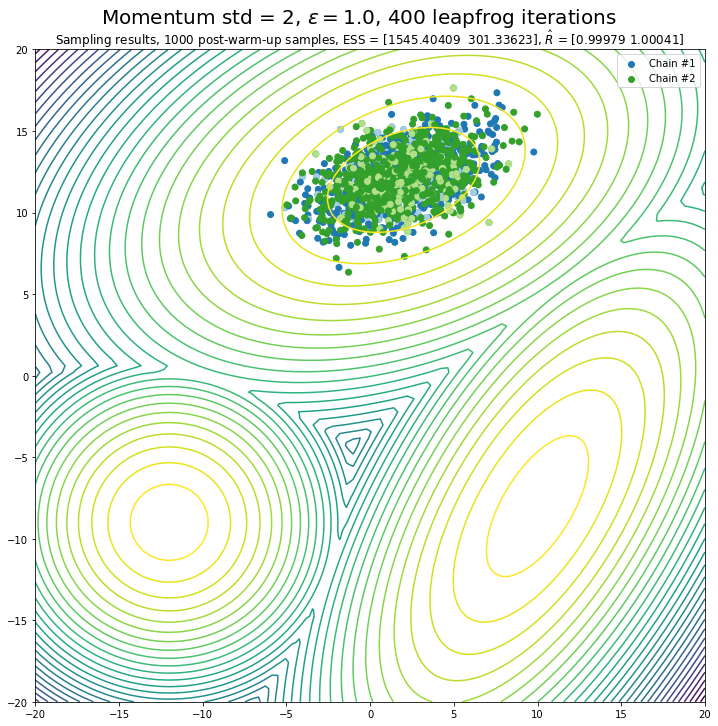

In [66]:
theta_0_sampler = lambda: np.random.uniform(-10, 10, 2)

epsilon =  1.0
leapfrog = 400
momentum_std = 2.0

def sample():
    return hmc.hamiltonian_monte_carlo(two_d_mixture_gaussians, theta_0_sampler(), 
                                       epsilon, leapfrog, 2000, 2, momentum_std=momentum_std, 
                                       log_interval=100)

all_samples, all_theta_samples = \
    sample_and_plot(sample, 2, two_d_mixture_gaussians, [-20, 20], [-20, 20], 
                   f'Momentum std = 2, $\\epsilon = {epsilon}$, {leapfrog} leapfrog iterations')

with open('results.pickle', 'rb') as f:
        results = pickle.load(f)
        
results[epsilon, leapfrog, momentum_std] = all_samples, all_theta_samples

with open('results.pickle', 'wb') as f:
    pickle.dump(results, f)

## Let's play with the temperature parameter and see what happens

HMC: sampling 2000 iterations with 400 leapfrog iterations with epsilon = 1.0
Sampled 100 iterations of which 96 were accepted
Sampled 200 iterations of which 190 were accepted
Sampled 300 iterations of which 289 were accepted
Sampled 400 iterations of which 386 were accepted
Sampled 500 iterations of which 482 were accepted
Sampled 600 iterations of which 578 were accepted
Sampled 700 iterations of which 676 were accepted
Sampled 800 iterations of which 774 were accepted
Sampled 900 iterations of which 873 were accepted
Sampled 1000 iterations of which 966 were accepted
Sampled 1100 iterations of which 1063 were accepted
Sampled 1200 iterations of which 1161 were accepted
Sampled 1300 iterations of which 1256 were accepted
Sampled 1400 iterations of which 1353 were accepted
Sampled 1500 iterations of which 1449 were accepted
Sampled 1600 iterations of which 1545 were accepted
Sampled 1700 iterations of which 1641 were accepted
Sampled 1800 iterations of which 1737 were accepted
Sample

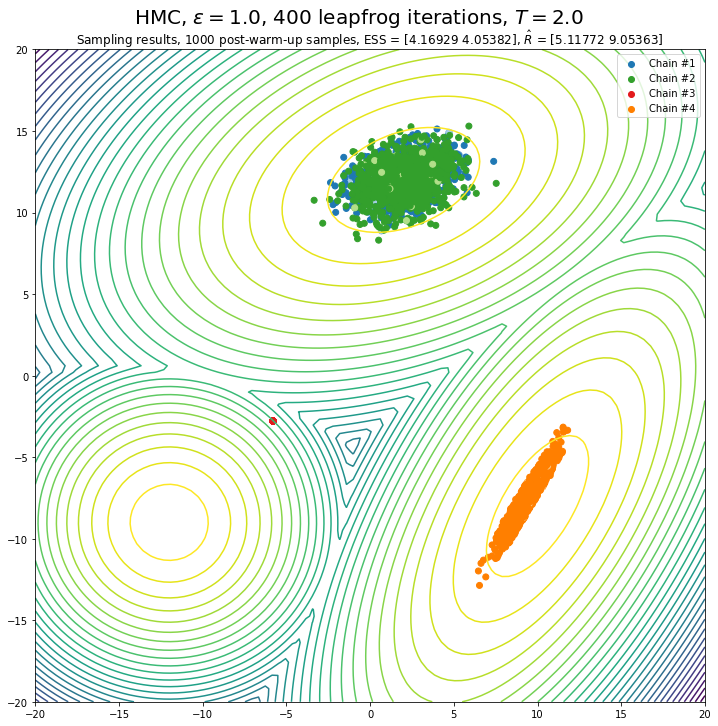

HMC: sampling 2000 iterations with 400 leapfrog iterations with epsilon = 1.0
Sampled 100 iterations of which 99 were accepted
Sampled 200 iterations of which 197 were accepted
Sampled 300 iterations of which 297 were accepted
Sampled 400 iterations of which 397 were accepted
Sampled 500 iterations of which 496 were accepted
Sampled 600 iterations of which 593 were accepted
Sampled 700 iterations of which 692 were accepted
Sampled 800 iterations of which 789 were accepted
Sampled 900 iterations of which 886 were accepted
Sampled 1000 iterations of which 983 were accepted
Sampled 1100 iterations of which 1081 were accepted
Sampled 1200 iterations of which 1180 were accepted
Sampled 1300 iterations of which 1276 were accepted
Sampled 1400 iterations of which 1371 were accepted
Sampled 1500 iterations of which 1470 were accepted
Sampled 1600 iterations of which 1568 were accepted
Sampled 1700 iterations of which 1667 were accepted
Sampled 1800 iterations of which 1762 were accepted
Sample

/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:76: RuntimeWarning: overflow encountered in true_divide
  defvjp(anp.log,    lambda ans, x : lambda g: g / x)
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/scipy/stats/multivariate_normal.py:50: RuntimeWarning: invalid value encountered in double_scalars
  unbroadcast_f(x, lambda g: -np.expand_dims(ans * g, 1) * solve(allow_singular)(cov, (x - mean).T).T),
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: divide by zero encountered in log
  return f_raw(*args, **kwargs)
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:76: RuntimeWarning: divide by zero encountered in true_divide
  defvjp(anp.log,    lambda ans, x : lambda g: g / x)


Sampled 100 iterations of which 92 were accepted
Sampled 200 iterations of which 188 were accepted
Sampled 300 iterations of which 285 were accepted
Sampled 400 iterations of which 383 were accepted
Sampled 500 iterations of which 476 were accepted
Sampled 600 iterations of which 574 were accepted
Sampled 700 iterations of which 673 were accepted
Sampled 800 iterations of which 768 were accepted
Sampled 900 iterations of which 867 were accepted
Sampled 1000 iterations of which 966 were accepted
Sampled 1100 iterations of which 1063 were accepted
Sampled 1200 iterations of which 1160 were accepted
Sampled 1300 iterations of which 1259 were accepted
Sampled 1400 iterations of which 1356 were accepted
Sampled 1500 iterations of which 1453 were accepted
Sampled 1600 iterations of which 1552 were accepted
Sampled 1700 iterations of which 1649 were accepted
Sampled 1800 iterations of which 1746 were accepted
Sampled 1900 iterations of which 1846 were accepted


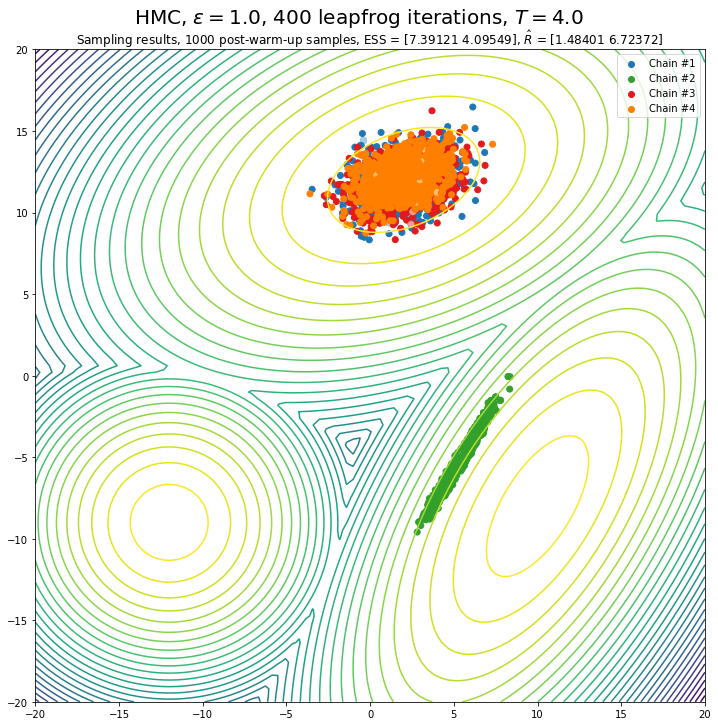

HMC: sampling 2000 iterations with 400 leapfrog iterations with epsilon = 1.0
Sampled 100 iterations of which 101 were accepted
Sampled 200 iterations of which 201 were accepted
Sampled 300 iterations of which 301 were accepted
Sampled 400 iterations of which 401 were accepted
Sampled 500 iterations of which 501 were accepted
Sampled 600 iterations of which 601 were accepted
Sampled 700 iterations of which 701 were accepted
Sampled 800 iterations of which 801 were accepted
Sampled 900 iterations of which 901 were accepted
Sampled 1000 iterations of which 1001 were accepted
Sampled 1100 iterations of which 1101 were accepted
Sampled 1200 iterations of which 1201 were accepted
Sampled 1300 iterations of which 1301 were accepted
Sampled 1400 iterations of which 1401 were accepted
Sampled 1500 iterations of which 1501 were accepted
Sampled 1600 iterations of which 1601 were accepted
Sampled 1700 iterations of which 1701 were accepted
Sampled 1800 iterations of which 1801 were accepted
Samp

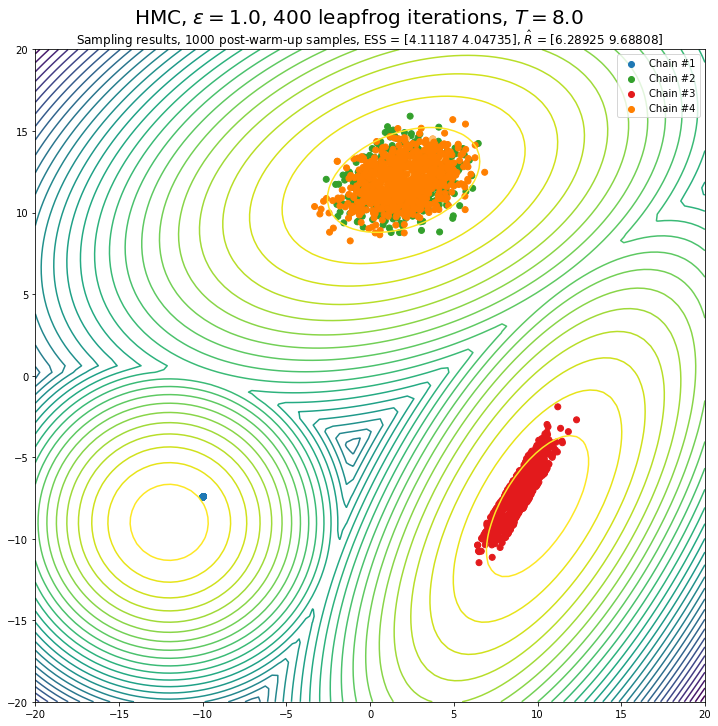

HMC: sampling 2000 iterations with 400 leapfrog iterations with epsilon = 1.0
Sampled 100 iterations of which 101 were accepted
Sampled 200 iterations of which 201 were accepted
Sampled 300 iterations of which 301 were accepted
Sampled 400 iterations of which 401 were accepted
Sampled 500 iterations of which 501 were accepted
Sampled 600 iterations of which 601 were accepted
Sampled 700 iterations of which 701 were accepted
Sampled 800 iterations of which 801 were accepted
Sampled 900 iterations of which 901 were accepted
Sampled 1000 iterations of which 1001 were accepted
Sampled 1100 iterations of which 1101 were accepted
Sampled 1200 iterations of which 1201 were accepted
Sampled 1300 iterations of which 1301 were accepted
Sampled 1400 iterations of which 1401 were accepted
Sampled 1500 iterations of which 1501 were accepted
Sampled 1600 iterations of which 1601 were accepted
Sampled 1700 iterations of which 1701 were accepted
Sampled 1800 iterations of which 1801 were accepted
Samp

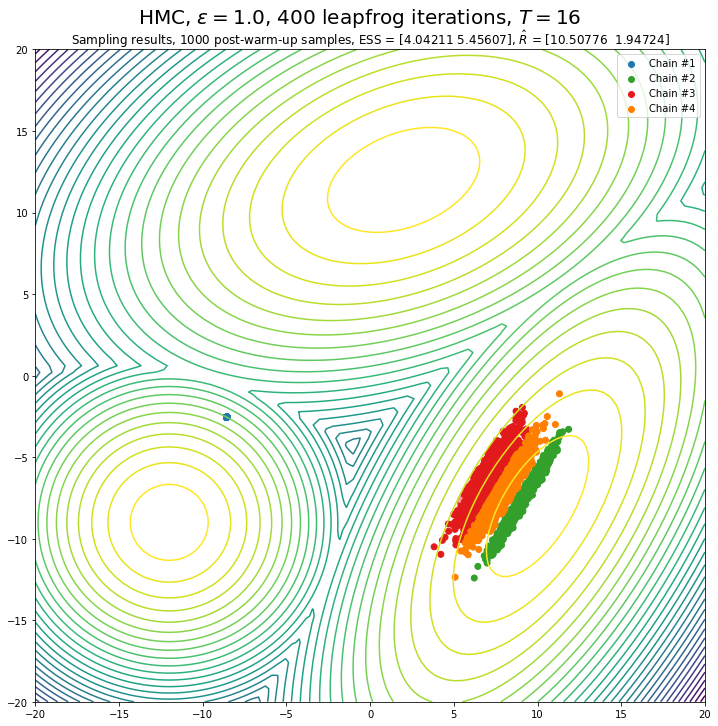

In [ ]:
theta_0_sampler = lambda: np.random.uniform(-10, 10, 2)
# results = {}

epsilon = 1.0
leapfrog = 400


for temperature in (2.0, 4.0, 8.0, 16):
    def sample():
        return hmc.hamiltonian_monte_carlo(two_d_mixture_gaussians, theta_0_sampler(), 
                                           epsilon, leapfrog, 2000, 2, temperature=temperature,
                                           log_interval=100)

    all_samples, all_theta_samples = \
        sample_and_plot(sample, 4, two_d_mixture_gaussians, [-20, 20], [-20, 20], 
                       f'HMC, $\\epsilon = {epsilon}$, {leapfrog} leapfrog iterations, $T = {temperature}$')

    with open('results.pickle', 'rb') as f:
            results = pickle.load(f)

    results['HMC', epsilon, leapfrog, 1.0, temperature] = all_samples, all_theta_samples
    
    with open('results.pickle', 'wb') as f:
        pickle.dump(results, f)

In [73]:
results.keys()

dict_keys([(0.2, 400), (0.2, 800), (0.8, 400), (1.6, 400), ('MH', 1.0), ('MH', 2.0), ('MH', 4.0), ('MH', 2.0, 2.0), ('MH', 2.0, 4.0), ('MH', 2.0, 8.0), ('MH', 2.0, 16.0), (1.0, 400, 2.0), ('HMC', 1.0, 400, 1.0, 2.0), ('HMC', 1.0, 400, 1.0, 4.0), ('HMC', 1.0, 400, 1.0, 8.0), ('HMC', 1.0, 400, 1.0, 16)])

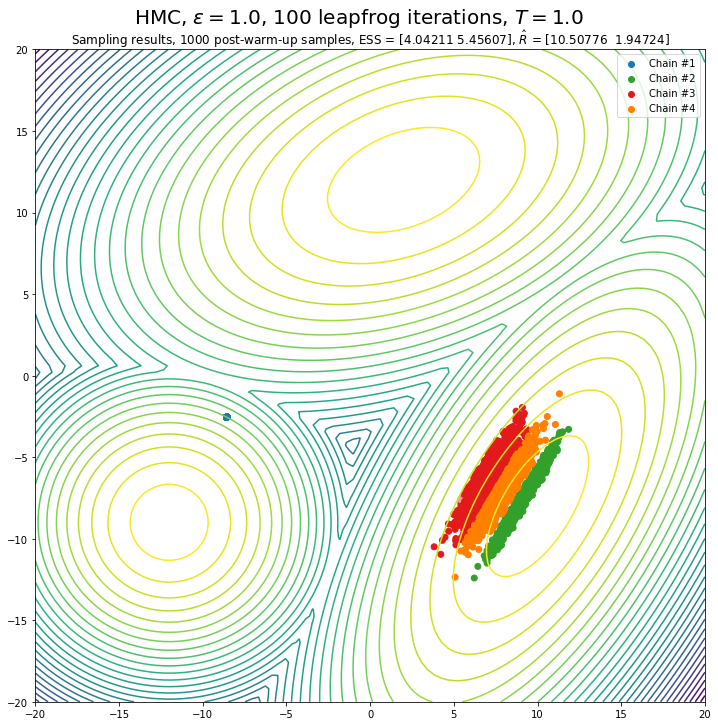

In [117]:
all_samples, all_theta_samples = results['HMC', 1.0, 400, 1.0, 16]
temperaure = 16.0
two_d_countour_plot(two_d_mixture_gaussians, 4, [-20, 20], [-20, 20], all_samples, all_theta_samples,
                   f'HMC, $\\epsilon = {epsilon}$, {leapfrog} leapfrog iterations, $T = {temperature}$',
                   temperature=temperature)

## Let's try formally (and forcefully) relaxing the problem by increasing the covariances

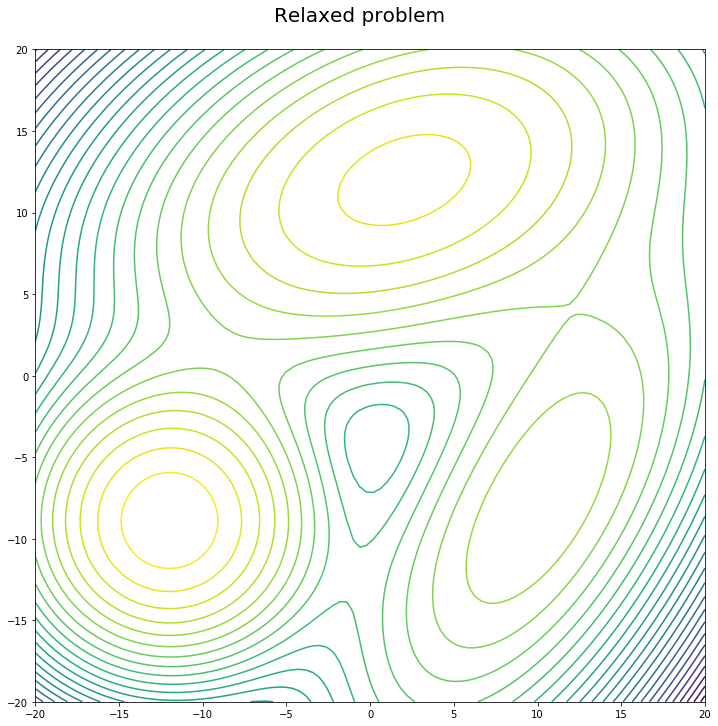

In [110]:
cov_scale = 50.0

def relaxed_two_d_mixture_gaussians(theta):
    return hmc.np.log(0.5 * hmc.stats.multivariate_normal.pdf(theta, mean=hmc.np.array([2, 12]),
                                                          cov=hmc.np.array(([[2, 0.5], [0.5, 1]])) * cov_scale) + \
                  0.25 * hmc.stats.multivariate_normal.pdf(theta, mean=hmc.np.array([10, -8]),
                                                           cov=hmc.np.array(([[1, 0.9], [0.9, 2]])) * cov_scale) + \
                  0.25 * hmc.stats.multivariate_normal.pdf(theta, mean=hmc.np.array([-12, -9]),
                                                           cov=hmc.np.array(([[0.5, 0], [0, 0.5]])) * cov_scale))

two_d_countour_plot(relaxed_two_d_mixture_gaussians, 0, [-20, 20], [-20, 20], None, None,
                   f'Relaxed problem')

HMC: sampling 2000 iterations with 100 leapfrog iterations with epsilon = 1.0
Sampled 100 iterations of which 101 were accepted
Sampled 200 iterations of which 201 were accepted
Sampled 300 iterations of which 301 were accepted
Sampled 400 iterations of which 401 were accepted
Sampled 500 iterations of which 500 were accepted
Sampled 600 iterations of which 600 were accepted
Sampled 700 iterations of which 700 were accepted
Sampled 800 iterations of which 800 were accepted
Sampled 900 iterations of which 900 were accepted
Sampled 1000 iterations of which 1000 were accepted
Sampled 1100 iterations of which 1100 were accepted
Sampled 1200 iterations of which 1200 were accepted
Sampled 1300 iterations of which 1300 were accepted
Sampled 1400 iterations of which 1400 were accepted
Sampled 1500 iterations of which 1499 were accepted
Sampled 1600 iterations of which 1598 were accepted
Sampled 1700 iterations of which 1697 were accepted
Sampled 1800 iterations of which 1797 were accepted
Samp

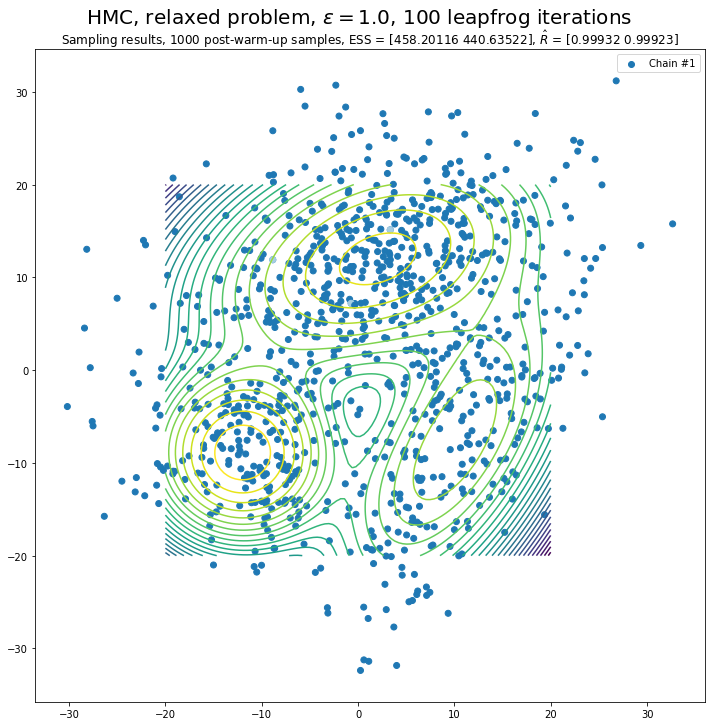

In [109]:
theta_0_sampler = lambda: np.random.uniform(-10, 10, 2)
# results = {}

epsilon = 1.0
leapfrog = 100
temperature = 1.0

def sample():
    return hmc.hamiltonian_monte_carlo(relaxed_two_d_mixture_gaussians, theta_0_sampler(), 
                                       epsilon, leapfrog, 2000, 2,
                                       log_interval=100)

all_samples, all_theta_samples = \
    sample_and_plot(sample, 1, relaxed_two_d_mixture_gaussians, [-20, 20], [-20, 20], 
                   f'HMC, relaxed problem, $\\epsilon = {epsilon}$, {leapfrog} leapfrog iterations')

with open('results.pickle', 'rb') as f:
        results = pickle.load(f)

results['HMC-relaxed', epsilon, leapfrog, 1.0, 1.0] = all_samples, all_theta_samples

with open('results.pickle', 'wb') as f:
    pickle.dump(results, f)

## Unsurprisingly, with the absurdly relaxed problem, HMC handles it well

Let's try relaxing it less and seeing how that affects performance?

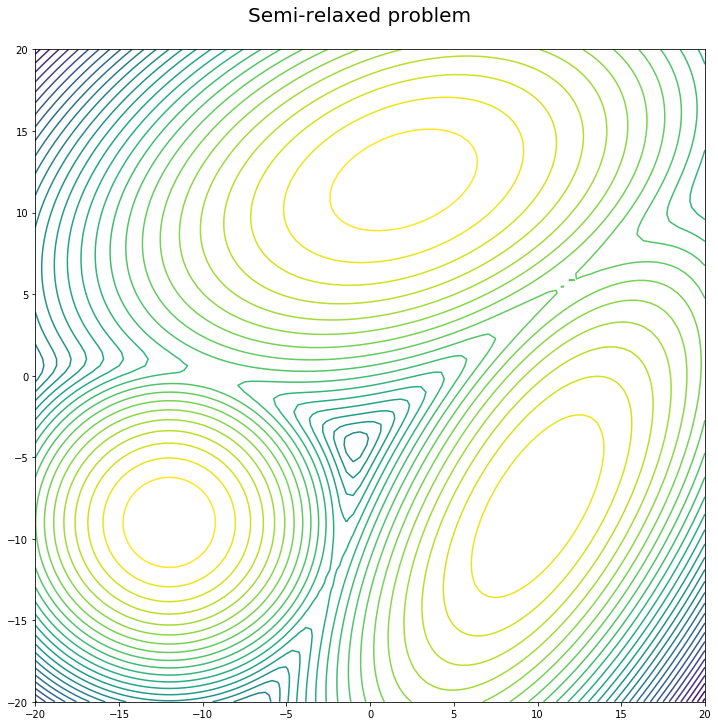

In [145]:
cov_scale = 10.0

def semi_relaxed_two_d_mixture_gaussians(theta):
    return hmc.np.log(0.5 * hmc.stats.multivariate_normal.pdf(theta, mean=hmc.np.array([2, 12]),
                                                          cov=hmc.np.array(([[2, 0.5], [0.5, 1]])) * cov_scale) + \
                  0.25 * hmc.stats.multivariate_normal.pdf(theta, mean=hmc.np.array([10, -8]),
                                                           cov=hmc.np.array(([[1, 0.9], [0.9, 2]])) * cov_scale) + \
                  0.25 * hmc.stats.multivariate_normal.pdf(theta, mean=hmc.np.array([-12, -9]),
                                                           cov=hmc.np.array(([[0.5, 0], [0, 0.5]])) * cov_scale))

two_d_countour_plot(semi_relaxed_two_d_mixture_gaussians, 0, [-20, 20], [-20, 20], None, None,
                   f'Semi-relaxed problem')

HMC: sampling 2000 iterations with 100 leapfrog iterations with epsilon = 1.0
Sampled 100 iterations of which 100 were accepted
Sampled 200 iterations of which 200 were accepted
Sampled 300 iterations of which 300 were accepted
Sampled 400 iterations of which 400 were accepted
Sampled 500 iterations of which 500 were accepted
Sampled 600 iterations of which 599 were accepted
Sampled 700 iterations of which 699 were accepted
Sampled 800 iterations of which 798 were accepted
Sampled 900 iterations of which 897 were accepted
Sampled 1000 iterations of which 996 were accepted
Sampled 1100 iterations of which 1096 were accepted
Sampled 1200 iterations of which 1194 were accepted
Sampled 1300 iterations of which 1293 were accepted
Sampled 1400 iterations of which 1393 were accepted
Sampled 1500 iterations of which 1493 were accepted
Sampled 1600 iterations of which 1592 were accepted
Sampled 1700 iterations of which 1690 were accepted
Sampled 1800 iterations of which 1788 were accepted
Sampl

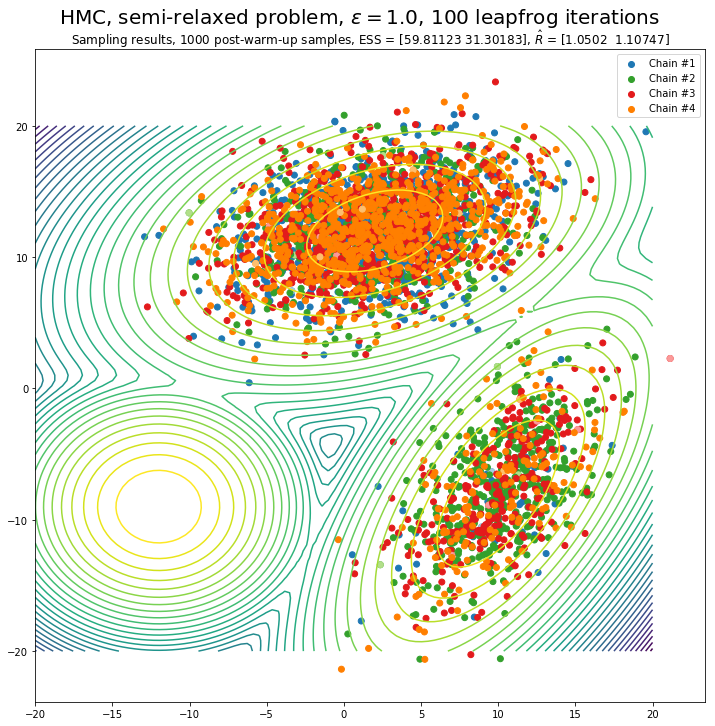

In [116]:
theta_0_sampler = lambda: np.random.uniform(-10, 10, 2)
# results = {}

epsilon = 1.0
leapfrog = 100
temperature = 1.0

def sample():
    return hmc.hamiltonian_monte_carlo(semi_relaxed_two_d_mixture_gaussians, theta_0_sampler(), 
                                       epsilon, leapfrog, 2000, 2, log_interval=100)

all_samples, all_theta_samples = \
    sample_and_plot(sample, 4, semi_relaxed_two_d_mixture_gaussians, [-20, 20], [-20, 20], 
                   f'HMC, semi-relaxed problem, $\\epsilon = {epsilon}$, {leapfrog} leapfrog iterations')

with open('results.pickle', 'rb') as f:
        results = pickle.load(f)

results['HMC-semi-relaxed', epsilon, leapfrog, 1.0, 1.0] = all_samples, all_theta_samples

with open('results.pickle', 'wb') as f:
    pickle.dump(results, f)

## One final idea - what if we vastly increase the momentum $\sigma$?

I would even try a non-normal distribution, but I don't want to break symmetry. Perhaps I can try something that's still symemtric but non zero mean, like a mixture of two normals: $q \sim 0.5 \mathcal{N}(\mu, \sigma) + 0.5 \mathcal{N}(-\mu, \sigma)$ 

In [118]:
mean = 3.0
std = 1.0
n_var = 2

def momentum_sampler():
    negative = np.random.uniform() < 0.5
    r = np.random.normal(mean, std, size=n_var)
    if negative:
        r *= -1
        
    return r

HMC: sampling 2000 iterations with 100 leapfrog iterations with epsilon = 1.0


/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:76: RuntimeWarning: overflow encountered in true_divide
  defvjp(anp.log,    lambda ans, x : lambda g: g / x)
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/scipy/stats/multivariate_normal.py:50: RuntimeWarning: invalid value encountered in double_scalars
  unbroadcast_f(x, lambda g: -np.expand_dims(ans * g, 1) * solve(allow_singular)(cov, (x - mean).T).T),
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: divide by zero encountered in log
  return f_raw(*args, **kwargs)
/Users/guydavidson/anaconda/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:76: RuntimeWarning: divide by zero encountered in true_divide
  defvjp(anp.log,    lambda ans, x : lambda g: g / x)


Sampled 100 iterations of which 59 were accepted
Sampled 200 iterations of which 137 were accepted
Sampled 300 iterations of which 217 were accepted
Sampled 400 iterations of which 299 were accepted
Sampled 500 iterations of which 377 were accepted
Sampled 600 iterations of which 448 were accepted
Sampled 700 iterations of which 528 were accepted
Sampled 800 iterations of which 607 were accepted
Sampled 900 iterations of which 679 were accepted
Sampled 1000 iterations of which 766 were accepted
Sampled 1100 iterations of which 847 were accepted
Sampled 1200 iterations of which 927 were accepted
Sampled 1300 iterations of which 1003 were accepted
Sampled 1400 iterations of which 1081 were accepted
Sampled 1500 iterations of which 1160 were accepted
Sampled 1600 iterations of which 1234 were accepted
Sampled 1700 iterations of which 1312 were accepted
Sampled 1800 iterations of which 1387 were accepted
Sampled 1900 iterations of which 1471 were accepted
HMC: sampling 2000 iterations with

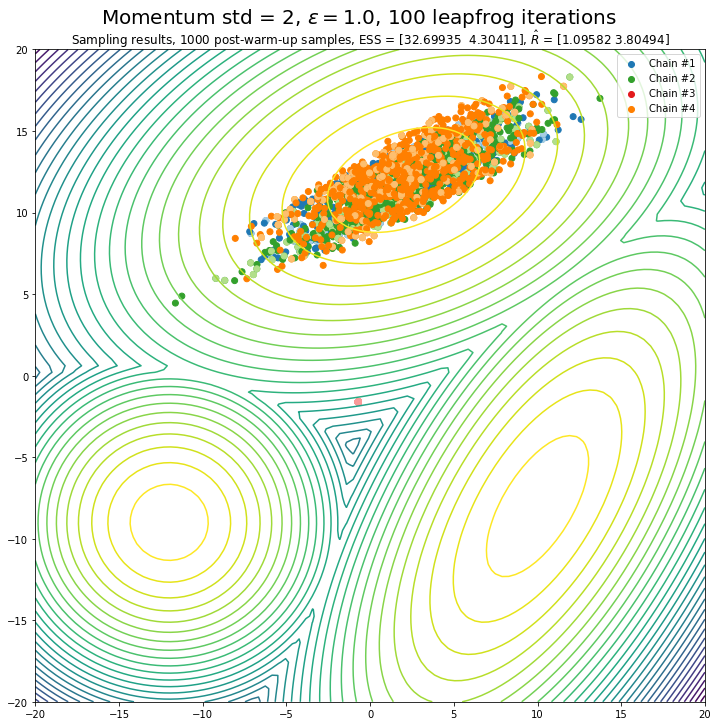

In [119]:
theta_0_sampler = lambda: np.random.uniform(-10, 10, 2)

epsilon =  1.0
leapfrog = 100

def sample():
    return hmc.hamiltonian_monte_carlo(two_d_mixture_gaussians, theta_0_sampler(), 
                                       epsilon, leapfrog, 2000, 2, momentum_std=momentum_sampler, 
                                       log_interval=100)

all_samples, all_theta_samples = \
    sample_and_plot(sample, 4, two_d_mixture_gaussians, [-20, 20], [-20, 20], 
                   f'Momentum std = 2, $\\epsilon = {epsilon}$, {leapfrog} leapfrog iterations')

with open('results.pickle', 'rb') as f:
        results = pickle.load(f)
        
results['HMC', epsilon, leapfrog, 'bimodal momentum sampler'] = all_samples, all_theta_samples

with open('results.pickle', 'wb') as f:
    pickle.dump(results, f)

## Tried implementing NUTS - let's see if that works?

NUTS: sampling 1000 iterations with epsilon = 0.1
Sampled 100 iterations
Sampled 200 iterations
Sampled 300 iterations
Sampled 400 iterations
Sampled 500 iterations
Sampled 600 iterations
Sampled 700 iterations
Sampled 800 iterations
Sampled 900 iterations
NUTS: sampling 1000 iterations with epsilon = 0.1
Sampled 100 iterations
Sampled 200 iterations
Sampled 300 iterations
Sampled 400 iterations
Sampled 500 iterations
Sampled 600 iterations
Sampled 700 iterations
Sampled 800 iterations
Sampled 900 iterations


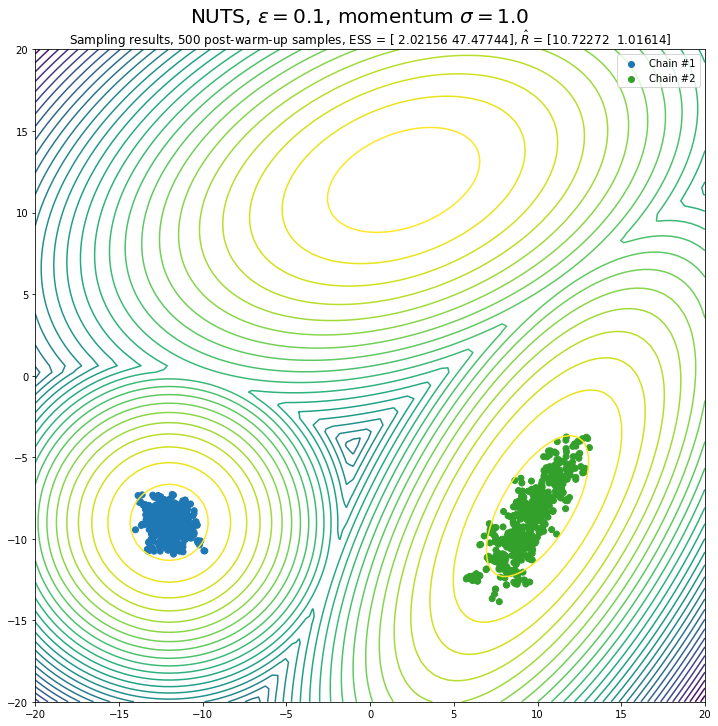

In [135]:
theta_0_sampler = lambda: np.random.uniform(-10, 10, 2)

epsilon =  0.1
momentum_std = 1.0

def sample():
    return hmc.no_u_turn_sampler(two_d_mixture_gaussians, theta_0_sampler(), 
                                 epsilon, 1000, 2, momentum_std=momentum_std, 
                                 log_interval=100)

all_samples, all_theta_samples = \
    sample_and_plot(sample, 2, two_d_mixture_gaussians, [-20, 20], [-20, 20], 
                   f'NUTS, $\\epsilon = {epsilon}$, momentum $\\sigma = {momentum_std}$')

with open('results.pickle', 'rb') as f:
        results = pickle.load(f)
        
results['NUTS', epsilon, None, momentum_std] = all_samples, all_theta_samples

with open('results.pickle', 'wb') as f:
    pickle.dump(results, f)

Same behavior - let's play with the momentum STD here as well?

NUTS: sampling 2000 iterations with epsilon = 0.1
Sampled 100 iterations
Sampled 200 iterations
Sampled 300 iterations
Sampled 400 iterations
Sampled 500 iterations
Sampled 600 iterations
Sampled 700 iterations
Sampled 800 iterations
Sampled 900 iterations
Sampled 1000 iterations
Sampled 1100 iterations
Sampled 1200 iterations
Sampled 1300 iterations
Sampled 1400 iterations
Sampled 1500 iterations
Sampled 1600 iterations
Sampled 1700 iterations
Sampled 1800 iterations
Sampled 1900 iterations
NUTS: sampling 2000 iterations with epsilon = 0.1
Sampled 100 iterations
Sampled 200 iterations
Sampled 300 iterations
Sampled 400 iterations
Sampled 500 iterations
Sampled 600 iterations
Sampled 700 iterations
Sampled 800 iterations
Sampled 900 iterations
Sampled 1000 iterations
Sampled 1100 iterations
Sampled 1200 iterations
Sampled 1300 iterations
Sampled 1400 iterations
Sampled 1500 iterations
Sampled 1600 iterations
Sampled 1700 iterations
Sampled 1800 iterations
Sampled 1900 iterations
NUTS: 

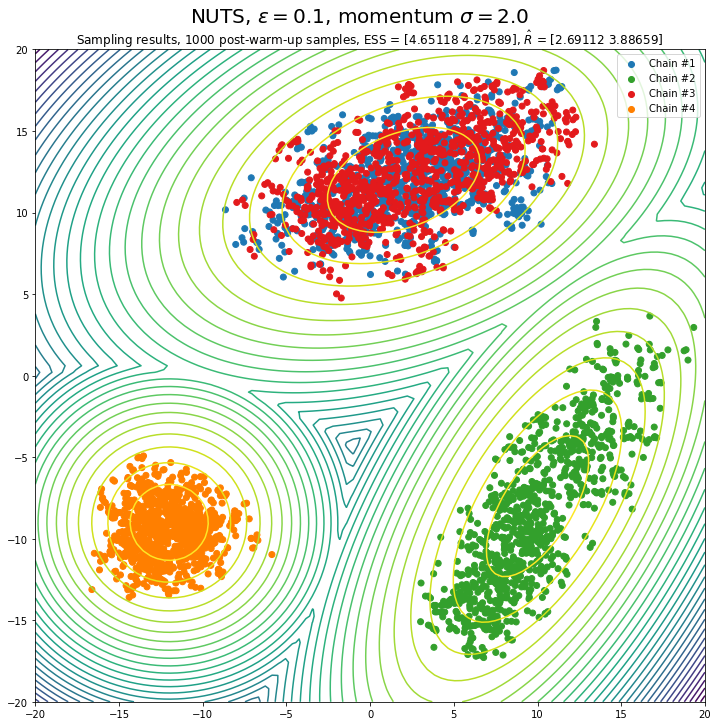

NUTS: sampling 2000 iterations with epsilon = 0.1
Sampled 100 iterations
Sampled 200 iterations
Sampled 300 iterations
Sampled 400 iterations
Sampled 500 iterations
Sampled 600 iterations
Sampled 700 iterations
Sampled 800 iterations
Sampled 900 iterations
Sampled 1000 iterations
Sampled 1100 iterations
Sampled 1200 iterations
Sampled 1300 iterations
Sampled 1400 iterations
Sampled 1500 iterations
Sampled 1600 iterations
Sampled 1700 iterations
Sampled 1800 iterations
Sampled 1900 iterations
NUTS: sampling 2000 iterations with epsilon = 0.1
Sampled 100 iterations
Sampled 200 iterations
Sampled 300 iterations
Sampled 400 iterations
Sampled 500 iterations
Sampled 600 iterations
Sampled 700 iterations
Sampled 800 iterations
Sampled 900 iterations
Sampled 1000 iterations
Sampled 1100 iterations
Sampled 1200 iterations
Sampled 1300 iterations
Sampled 1400 iterations
Sampled 1500 iterations
Sampled 1600 iterations
Sampled 1700 iterations
Sampled 1800 iterations
Sampled 1900 iterations
NUTS: 

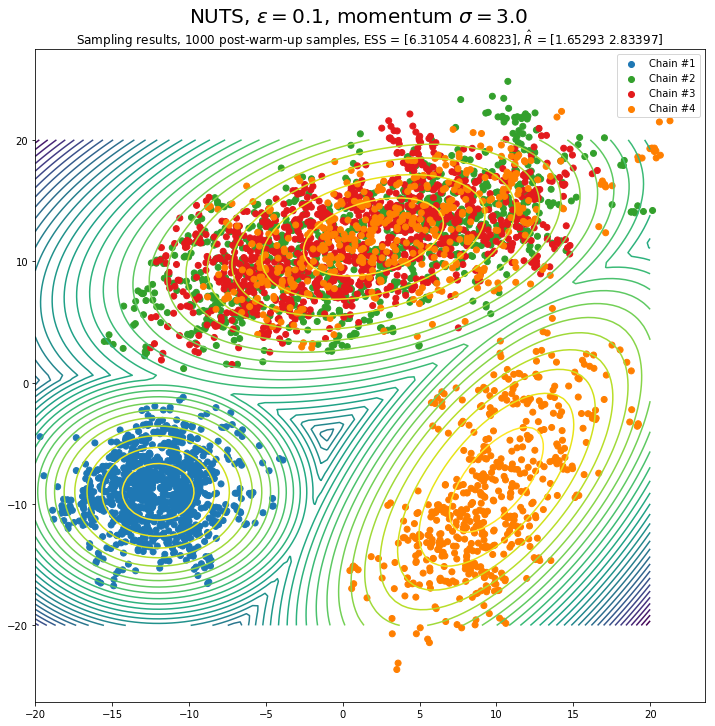

NUTS: sampling 2000 iterations with epsilon = 0.1
Sampled 100 iterations
Sampled 200 iterations
Sampled 300 iterations
Sampled 400 iterations
Sampled 500 iterations
Sampled 600 iterations
Sampled 700 iterations
Sampled 800 iterations
Sampled 900 iterations
Sampled 1000 iterations
Sampled 1100 iterations
Sampled 1200 iterations
Sampled 1300 iterations
Sampled 1400 iterations
Sampled 1500 iterations
Sampled 1600 iterations
Sampled 1700 iterations
Sampled 1800 iterations
Sampled 1900 iterations
NUTS: sampling 2000 iterations with epsilon = 0.1
Sampled 100 iterations
Sampled 200 iterations
Sampled 300 iterations
Sampled 400 iterations
Sampled 500 iterations
Sampled 600 iterations
Sampled 700 iterations
Sampled 800 iterations
Sampled 900 iterations
Sampled 1000 iterations
Sampled 1100 iterations
Sampled 1200 iterations
Sampled 1300 iterations
Sampled 1400 iterations
Sampled 1500 iterations
Sampled 1600 iterations
Sampled 1700 iterations
Sampled 1800 iterations
Sampled 1900 iterations
NUTS: 

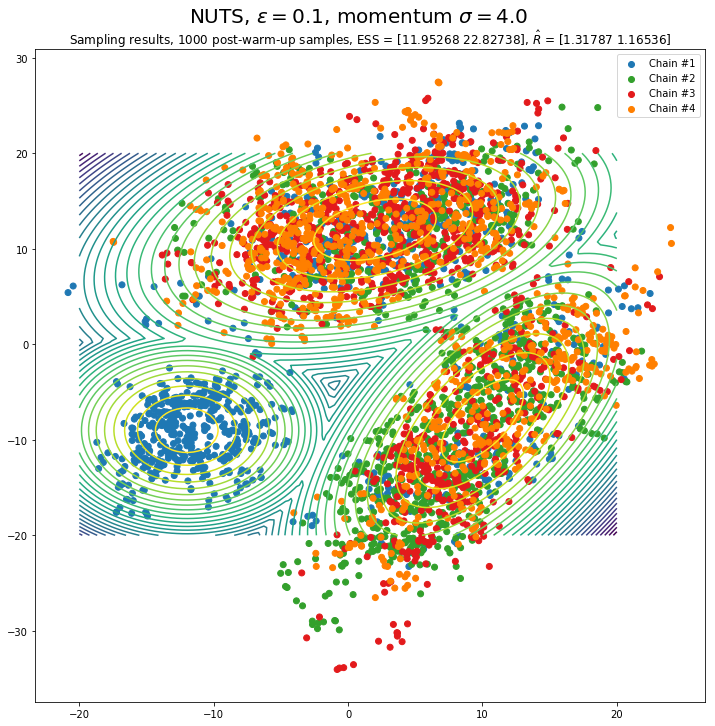

In [140]:
theta_0_sampler = lambda: np.random.uniform(-10, 10, 2)

epsilon =  0.1

for momentum_std in (2.0, 3.0, 4.0):
    def sample():
        return hmc.no_u_turn_sampler(two_d_mixture_gaussians, theta_0_sampler(), 
                                     epsilon, 2000, 2, momentum_std=momentum_std, 
                                     log_interval=100)

    all_samples, all_theta_samples = \
        sample_and_plot(sample, 4, two_d_mixture_gaussians, [-20, 20], [-20, 20], 
                       f'NUTS, $\\epsilon = {epsilon}$, momentum $\\sigma = {momentum_std}$')

    with open('results.pickle', 'rb') as f:
            results = pickle.load(f)

    results['NUTS', epsilon, None, momentum_std] = all_samples, all_theta_samples

    with open('results.pickle', 'wb') as f:
        pickle.dump(results, f)

## And what does NUTS look like with a higher value of $\epsilon$?

Theoretically it shouldn't improve much, since it samples until the point of U-turn anyway, so a lower $\epsilon$  might just improve the approximation but pay with additional computation

NUTS: sampling 2000 iterations with epsilon = 0.5
Sampled 100 iterations
Encountered an empty result set on iteration 171
Sampled 200 iterations
Sampled 300 iterations
Sampled 400 iterations
Encountered an empty result set on iteration 453
Encountered an empty result set on iteration 478
Sampled 500 iterations
Sampled 600 iterations
Encountered an empty result set on iteration 608
Encountered an empty result set on iteration 683
Sampled 700 iterations
Sampled 800 iterations
Encountered an empty result set on iteration 839
Sampled 900 iterations
Sampled 1000 iterations
Encountered an empty result set on iteration 1071
Sampled 1100 iterations
Sampled 1200 iterations
Sampled 1300 iterations
Encountered an empty result set on iteration 1397
Sampled 1400 iterations
Sampled 1500 iterations
Sampled 1600 iterations
Sampled 1700 iterations
Sampled 1800 iterations
Sampled 1900 iterations
Encountered an empty result set on iteration 1942
Encountered an empty result set on iteration 1949
NUTS: sam

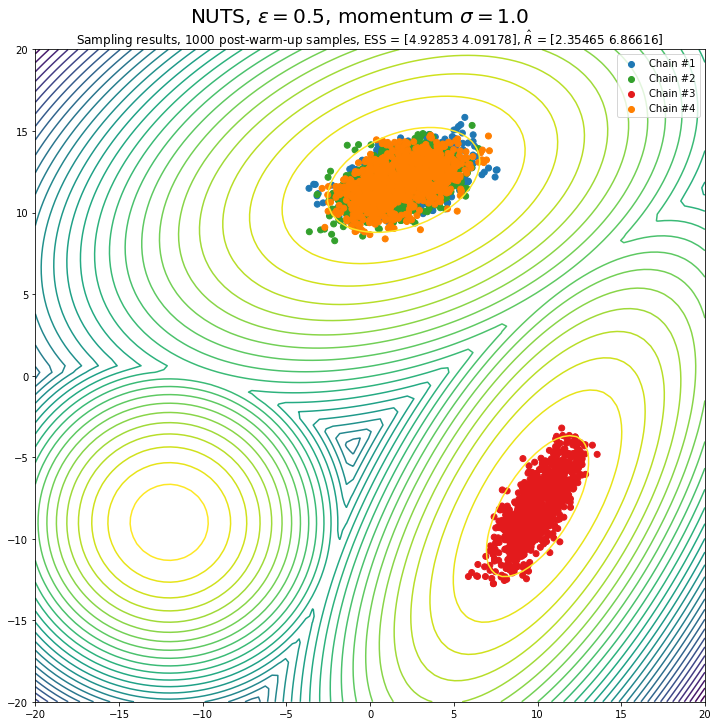

NUTS: sampling 2000 iterations with epsilon = 0.5
Encountered an empty result set on iteration 3
Encountered an empty result set on iteration 9
Encountered an empty result set on iteration 13
Encountered an empty result set on iteration 14
Encountered an empty result set on iteration 36
Encountered an empty result set on iteration 45
Encountered an empty result set on iteration 61
Encountered an empty result set on iteration 83
Encountered an empty result set on iteration 85
Encountered an empty result set on iteration 92
Encountered an empty result set on iteration 97
Encountered an empty result set on iteration 99
Sampled 100 iterations
Encountered an empty result set on iteration 102
Encountered an empty result set on iteration 104
Encountered an empty result set on iteration 105
Encountered an empty result set on iteration 128
Encountered an empty result set on iteration 136
Encountered an empty result set on iteration 149
Encountered an empty result set on iteration 181
Encountere

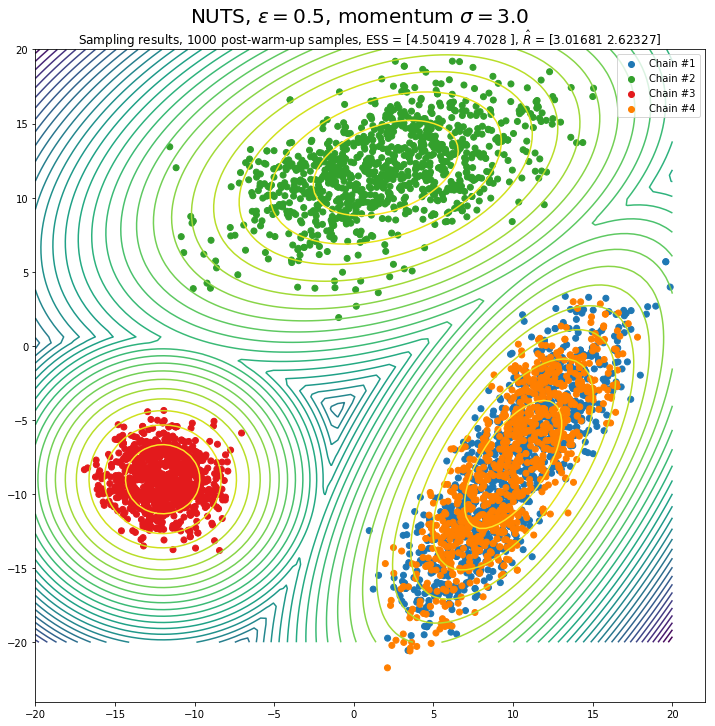

NUTS: sampling 2000 iterations with epsilon = 0.5
Encountered an empty result set on iteration 22
Encountered an empty result set on iteration 26
Encountered an empty result set on iteration 42
Encountered an empty result set on iteration 71
Encountered an empty result set on iteration 75
Encountered an empty result set on iteration 76
Encountered an empty result set on iteration 77
Encountered an empty result set on iteration 81
Sampled 100 iterations
Encountered an empty result set on iteration 134
Encountered an empty result set on iteration 137
Encountered an empty result set on iteration 154
Encountered an empty result set on iteration 155
Encountered an empty result set on iteration 163
Encountered an empty result set on iteration 171
Encountered an empty result set on iteration 173
Encountered an empty result set on iteration 174
Encountered an empty result set on iteration 188
Encountered an empty result set on iteration 189
Encountered an empty result set on iteration 200
Samp

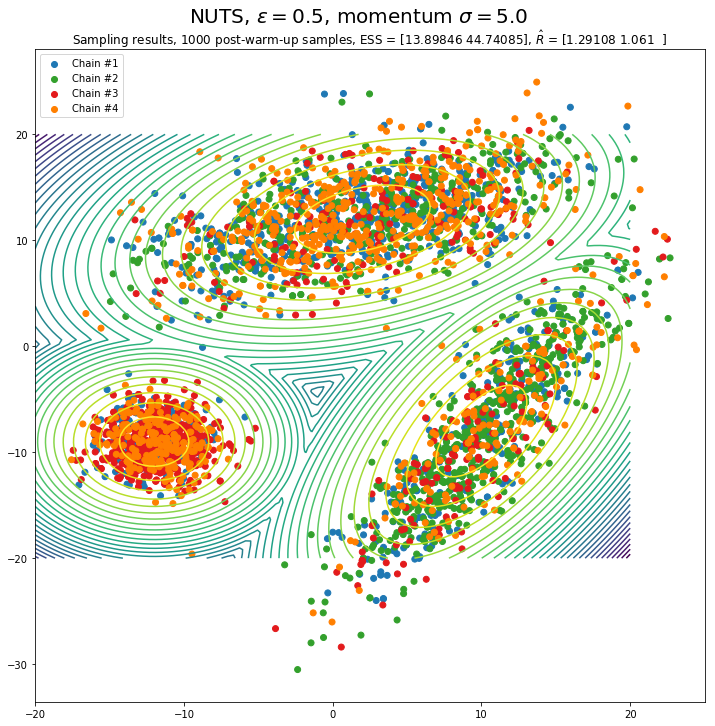

In [143]:
theta_0_sampler = lambda: np.random.uniform(-10, 10, 2)

epsilon = 0.5

for momentum_std in (1.0, 3.0, 5.0):
    def sample():
        return hmc.no_u_turn_sampler(two_d_mixture_gaussians, theta_0_sampler(), 
                                     epsilon, 2000, 2, momentum_std=momentum_std, 
                                     log_interval=100)

    all_samples, all_theta_samples = \
        sample_and_plot(sample, 4, two_d_mixture_gaussians, [-20, 20], [-20, 20], 
                       f'NUTS, $\\epsilon = {epsilon}$, momentum $\\sigma = {momentum_std}$')

    with open('results.pickle', 'rb') as f:
            results = pickle.load(f)

    results['NUTS', epsilon, None, momentum_std] = all_samples, all_theta_samples

    with open('results.pickle', 'wb') as f:
        pickle.dump(results, f)